## Разведочный анализ исходных данных


In [23]:
# Необходимые для работы библиотеки 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
Model_choice = pd.DataFrame(columns=['Model', 'MAE', 'R squared'])
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
from sklearn.neural_network import MLPRegressor

In [19]:
# Загрузка исходных данных из файла X_bp
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)


In [20]:
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [21]:
x_bp.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342


In [24]:
# Загрузка исходных данных из файла X_nup
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [25]:
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [26]:
x_nup.tail()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479
1039,90,9.021043,66.920143


In [27]:
# Объединение датасетов, тип объединения INNER
df = x_bp.join(x_nup, how = 'inner')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

После объединения датасетов, размер итогового датасета равен меньшему из исходных.

In [28]:
df.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,90,6.078902,77.434468


In [29]:
# Поиск пропусков
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Пропусков нет

In [30]:
# Подсчёт уникальных значений
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [31]:
df['Угол нашивки, град'][df['Угол нашивки, град'] == 0.0].count()

520

In [32]:
df['Угол нашивки, град'][df['Угол нашивки, град'] == 90.0].count()

503

Так как угол нашивки имеет всего два значения имеет смысл использовать его как категориальный признак и заменить его значения на 1 и 0, вместо 90 и 0

In [33]:
converter = OrdinalEncoder()
converter.fit(df[['Угол нашивки, град']])
df[['Угол нашивки, град']] = converter.transform(df[['Угол нашивки, град']])


In [34]:
df['Угол нашивки, град'][df['Угол нашивки, град'] == 0.0].count()

520

In [35]:
df['Угол нашивки, град'][df['Угол нашивки, град'] == 1.0].count()

503

In [36]:
df.tail()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1.0,6.313201,58.261074
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342,1.0,6.078902,77.434468


In [37]:
# Получим для каждой колонки среднее, стандартное отклонение, минимальное, максимальное, первый квартиль, медианное значение, третий квартиль
df_stat = df.describe().T

In [38]:
# Округлим до 3 знаков после запятой
df_stat.round(3)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930,0.913,0.389,2.318,2.907,3.553,5.592
"Плотность, кг/м3",1023.0,1975.735,73.729,1731.765,1924.155,1977.622,2021.374,2207.773
"модуль упругости, ГПа",1023.0,739.923,330.232,2.437,500.047,739.664,961.813,1911.536
"Количество отвердителя, м.%",1023.0,110.571,28.296,17.740,92.443,110.565,129.730,198.953
"Содержание эпоксидных групп,%_2",1023.0,22.244,2.406,14.255,20.608,22.231,23.962,33.000
"Температура вспышки, С_2",1023.0,285.882,40.943,100.000,259.067,285.897,313.002,413.273
"Поверхностная плотность, г/м2",1023.0,482.732,281.315,0.604,266.817,451.864,693.225,1399.542
"Модуль упругости при растяжении, ГПа",1023.0,73.329,3.119,64.054,71.245,73.269,75.357,82.682
"Прочность при растяжении, МПа",1023.0,2466.923,485.628,1036.857,2135.850,2459.525,2767.193,3848.437
"Потребление смолы, г/м2",1023.0,218.423,59.736,33.803,179.628,219.199,257.482,414.591


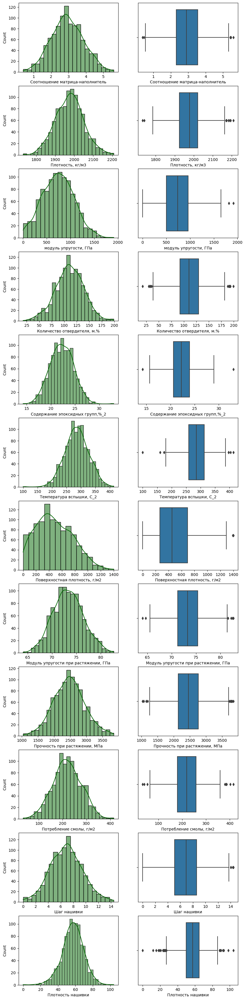

In [44]:
# Построим гистограммы распределения и ящики с усами до нормализации данных, исключая угол нашивки как категориальный признак

df1 = df.drop(['Угол нашивки, град'], axis = 1)
fig, axes = plt.subplots(12, 2, figsize = (10, 45))
for k, column in enumerate(df1.columns):    
    sns.histplot(data = df1, x = column, kde = True, color = "#006500", ax = axes[k, 0])
    sns.boxplot(data = df1, x = column, ax = axes[k, 1])

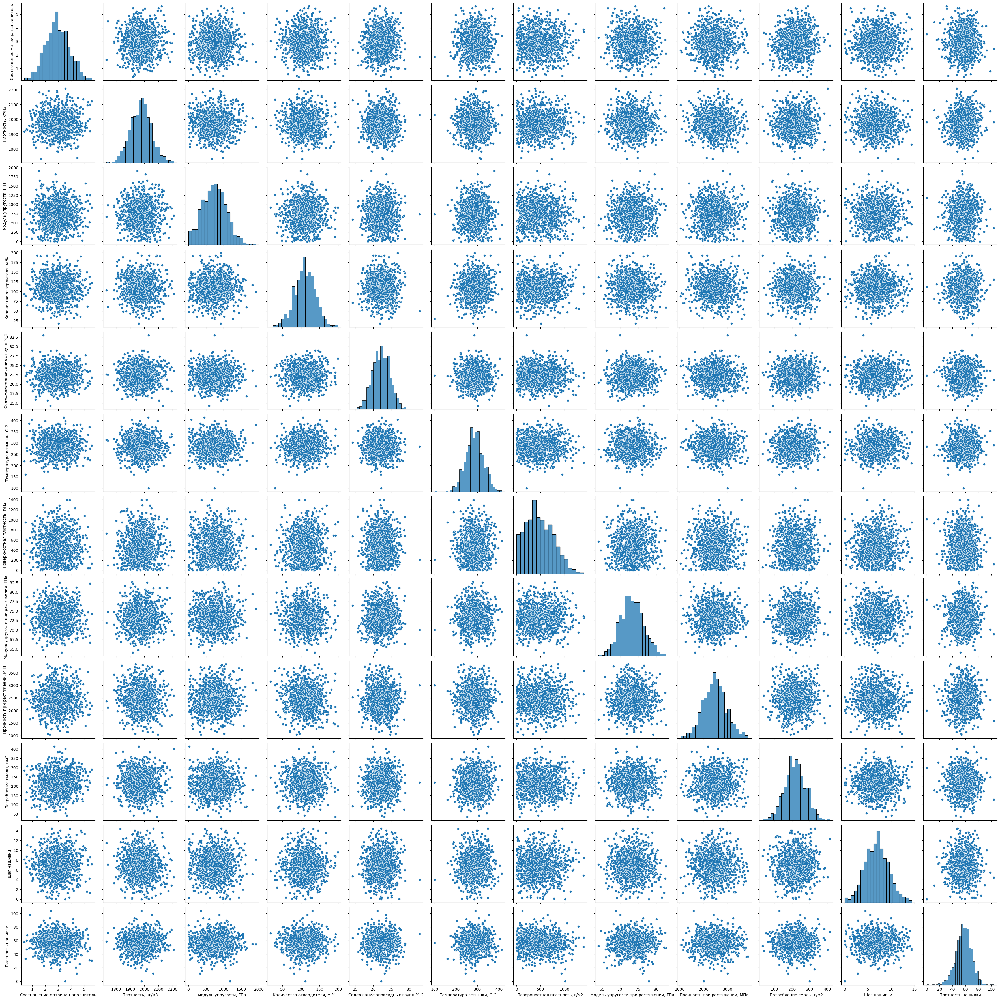

In [45]:
# Попарные графики рассеяния
sns.pairplot(df1, height = 3);

Попарные графики рассеяния точек в нашем случае малоинформативны. Зависимости не линейные. 
Найдём коэффициенты корреляции 

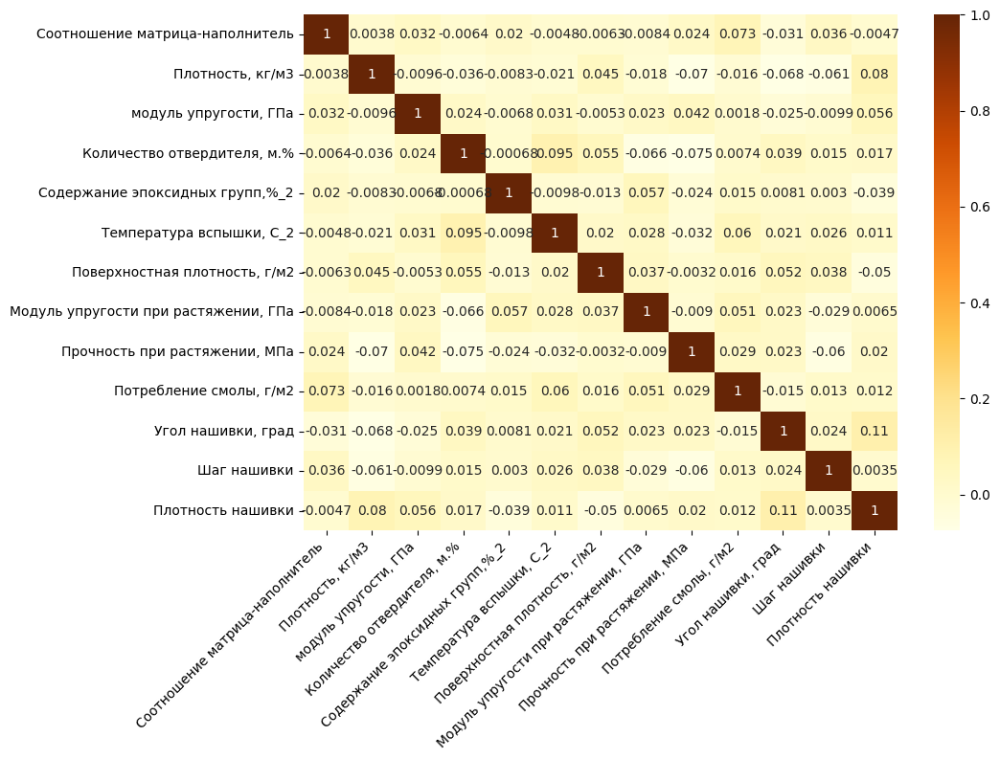

In [46]:
f, ax = plt.subplots(figsize = (10, 7))
sns.heatmap(df.corr(), annot = True, cmap = 'YlOrBr')
plt.xticks(rotation = 45, ha='right')
plt.show()

# На тепловой карте видно, что корреляции между данными близка к нулю

Далее проведём предобработку данных, перед тем как строить модели для прогноза

Сделаем масштабирование параметров таким образом, чтобы они находились между 0 и 1, чтобы максимальное абсолютное значение каждой функции масштабировалось до размера единицы. Это позволит повысить устойчивость к небольшим стандартным отклонениям

In [47]:
# Масштабирование 
# min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(MinMaxScaler().fit_transform(df), columns = df.columns, index = df.index)
df_norm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.548135
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.576985
2,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.673149
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.451971
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.548135
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.361750,0.462855,0.476884,0.382158,0.313057,0.717503,0.149109,0.485125,0.480312,0.239516,1.0,0.628535,0.452161
1019,0.587163,0.668737,0.231678,0.707685,0.285131,0.492271,0.250230,0.475992,0.470745,0.220404,1.0,0.731664,0.516890
1020,0.555750,0.505470,0.217065,0.512067,0.517605,0.473781,0.528643,0.573346,0.578340,0.532590,1.0,0.288158,0.650355
1021,0.637396,0.703842,0.387114,0.682389,0.266309,0.561107,0.458108,0.536217,0.368070,0.428909,1.0,0.437186,0.560262


Для удаления выбросов будет использоваться межквартильный диапазон набора данных, который представляет собой разницу между первым квартилем (25-й процентиль) и третьим квартилем (75-й процентиль)  от медианы. Это позволит исключить все данные, которые более чем в f раз превышают межквартильный диапазон от медианы данных.  

In [48]:
# Удаление выбросов

df_filtered = df_norm
cols = df_filtered.select_dtypes('number').columns 
df_sub = df_filtered.loc[:, cols]
# Межквартильный диапазон - iqr filter (2.22 эквивалентно z-оценке = 3)
iqr = df_sub.quantile(0.75, numeric_only = False) - df_sub.quantile(0.25, numeric_only = False)
lim = np.abs((df_sub - df_sub.median()) / iqr) < 2.22
# Удаление строк с выбросами
df_filtered.loc[:, cols] = df_sub.where(lim, np.nan)
df_filtered.dropna(inplace = True)

df_filtered

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.576985
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.451971
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.548135
5,0.457201,0.563509,0.390531,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.576985
6,0.419084,0.374437,0.421436,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.673149
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.361750,0.462855,0.476884,0.382158,0.313057,0.717503,0.149109,0.485125,0.480312,0.239516,1.0,0.628535,0.452161
1019,0.587163,0.668737,0.231678,0.707685,0.285131,0.492271,0.250230,0.475992,0.470745,0.220404,1.0,0.731664,0.516890
1020,0.555750,0.505470,0.217065,0.512067,0.517605,0.473781,0.528643,0.573346,0.578340,0.532590,1.0,0.288158,0.650355
1021,0.637396,0.703842,0.387114,0.682389,0.266309,0.561107,0.458108,0.536217,0.368070,0.428909,1.0,0.437186,0.560262


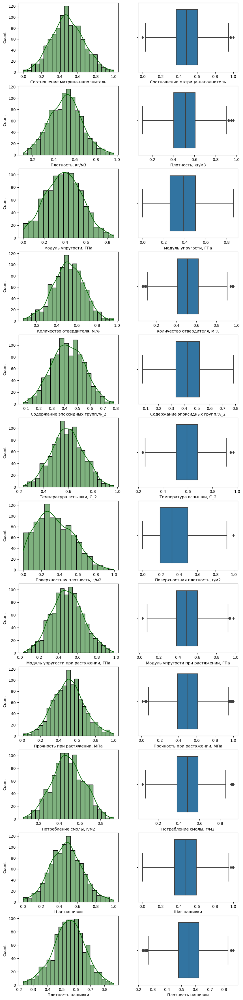

In [50]:
# Построим гистограммы распределения и ящики с усами после нормализации данных и удаления выбросов, исключая угол нашивки как категориальный признак
df_filtered1 = df_filtered.drop(['Угол нашивки, град'], axis = 1)
fig, axes = plt.subplots(12, 2, figsize = (10, 45))
for k, column in enumerate(df_filtered1.columns):    
    sns.histplot(data = df_filtered1, x = column, kde = True, color = "#006500", ax = axes[k, 0])
    sns.boxplot(data = df_filtered1, x = column, ax = axes[k, 1])

In [51]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 992 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       992 non-null    float64
 1   Плотность, кг/м3                      992 non-null    float64
 2   модуль упругости, ГПа                 992 non-null    float64
 3   Количество отвердителя, м.%           992 non-null    float64
 4   Содержание эпоксидных групп,%_2       992 non-null    float64
 5   Температура вспышки, С_2              992 non-null    float64
 6   Поверхностная плотность, г/м2         992 non-null    float64
 7   Модуль упругости при растяжении, ГПа  992 non-null    float64
 8   Прочность при растяжении, МПа         992 non-null    float64
 9   Потребление смолы, г/м2               992 non-null    float64
 10  Угол нашивки, град                    992 non-null    float64
 11  Шаг нашивки            

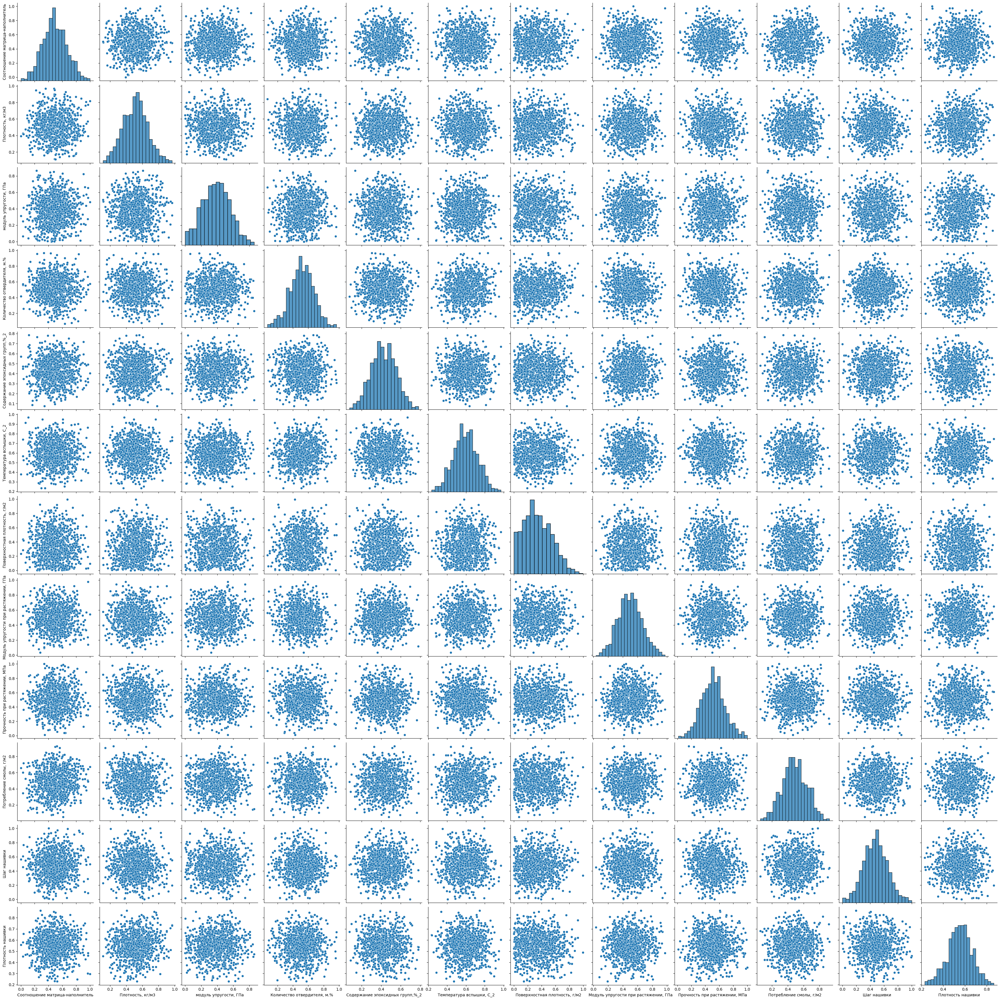

In [52]:
# Попарные графики рассеяния
sns.pairplot(df_filtered1, height=3);

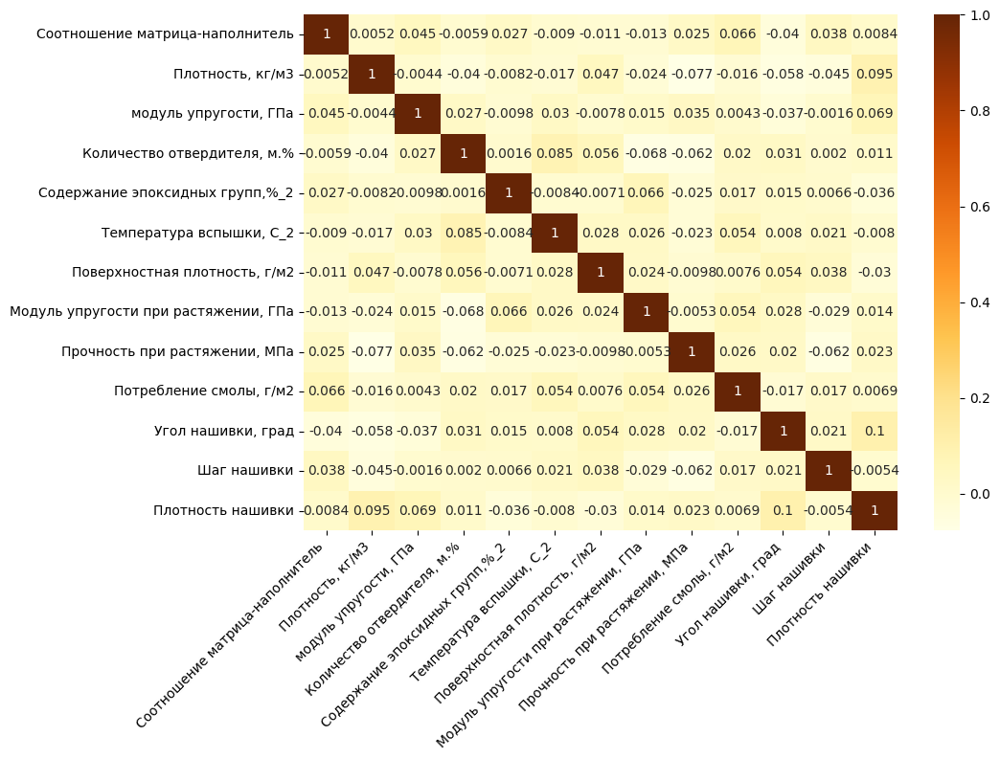

In [53]:
f, ax = plt.subplots(figsize = (10, 7))
sns.heatmap(df_filtered.corr(), annot = True, cmap = 'YlOrBr')
plt.xticks(rotation = 45, ha='right')
plt.show()

# На тепловой карте видно, что корреляция осталась на том же уровне

<Axes: ylabel='Density'>

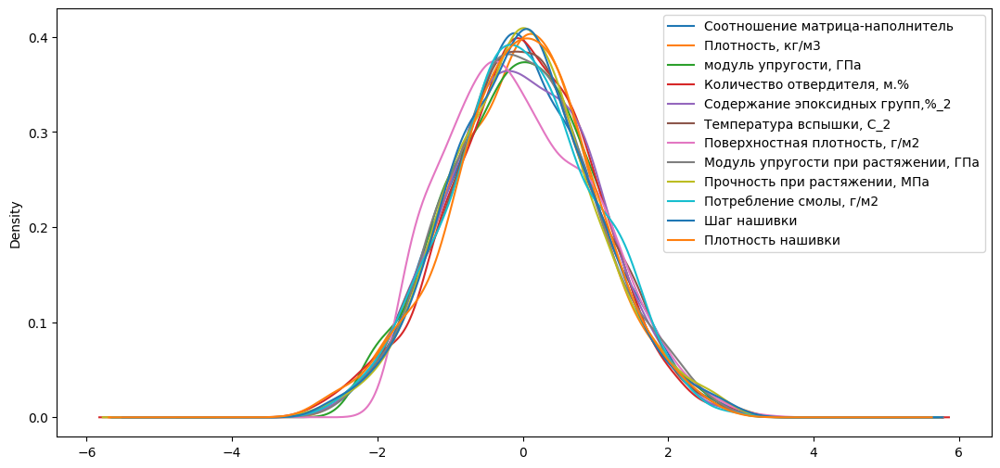

In [54]:
# Стандартизация 
# st_sc = StandardScaler() 
# df_standart = pd.DataFrame(st_sc.fit_transform(df_filtered), columns = df_filtered.columns, index = df_filtered.index)
x1_columns = [
    'Соотношение матрица-наполнитель',
    'Плотность, кг/м3',
    'модуль упругости, ГПа',
    'Количество отвердителя, м.%',
    'Содержание эпоксидных групп,%_2',
    'Температура вспышки, С_2',
    'Поверхностная плотность, г/м2',
    'Модуль упругости при растяжении, ГПа',
    'Прочность при растяжении, МПа',
    'Потребление смолы, г/м2',
    'Шаг нашивки',
    'Плотность нашивки'
]
df_standart = df_filtered.copy()
features = df_standart[x1_columns]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)
df_standart[x1_columns] = features
# Визуализация без угла нашивки
df_standart1 = df_standart.drop(['Угол нашивки, град'], axis = 1)
fig, ax = plt.subplots(figsize = (13, 6))
df_standart1.plot(kind = 'kde', ax = ax)

In [55]:
# Угол нашиивки как категориальный признак не трогаем
# df_standart['Угол нашивки'] = df_filtered['Угол нашивки']
df_standart.info()

<class 'pandas.core.frame.DataFrame'>
Index: 992 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       992 non-null    float64
 1   Плотность, кг/м3                      992 non-null    float64
 2   модуль упругости, ГПа                 992 non-null    float64
 3   Количество отвердителя, м.%           992 non-null    float64
 4   Содержание эпоксидных групп,%_2       992 non-null    float64
 5   Температура вспышки, С_2              992 non-null    float64
 6   Поверхностная плотность, г/м2         992 non-null    float64
 7   Модуль упругости при растяжении, ГПа  992 non-null    float64
 8   Прочность при растяжении, МПа         992 non-null    float64
 9   Потребление смолы, г/м2               992 non-null    float64
 10  Угол нашивки, град                    992 non-null    float64
 11  Шаг нашивки            

In [56]:
df_standart

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,-1.187620,0.746058,-0.002896,-2.183911,0.635922,-0.033119,-0.967516,-1.076183,1.106020,0.030083,0.0,-1.136116,0.233043
3,-1.187620,0.746058,-0.002896,0.649938,-0.411230,0.348442,-0.967516,-1.076183,1.106020,0.030083,0.0,-0.744811,-0.882272
4,-0.181679,0.746058,0.040591,0.035100,0.015111,-0.033119,-0.967516,-1.076183,1.106020,0.030083,0.0,-0.744811,-0.024337
5,-0.185434,0.334952,0.025346,0.035100,0.015111,-0.033119,-0.967516,-1.076183,1.106020,0.030083,0.0,-0.744811,0.233043
6,-0.403634,-0.898366,0.205232,0.035100,0.015111,-0.033119,-0.967516,-1.076183,1.106020,0.030083,0.0,-0.744811,1.090978
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,-0.731845,-0.321613,0.527976,-0.856946,-0.883182,0.962886,-0.970382,-0.066996,-0.165346,-1.588905,1.0,0.850299,-0.880576
1019,0.558528,1.021351,-0.899287,1.259107,-1.102447,-0.787081,-0.464354,-0.122544,-0.221163,-1.712939,1.0,1.433044,-0.303098
1020,0.378708,-0.043637,-0.984340,-0.012484,0.722837,-0.930740,0.928874,0.469562,0.406551,0.313117,1.0,-1.073056,0.887621
1021,0.846085,1.250346,0.005454,1.094671,-1.250231,-0.252253,0.575902,0.243746,-0.820167,-0.359766,1.0,-0.230948,0.083855


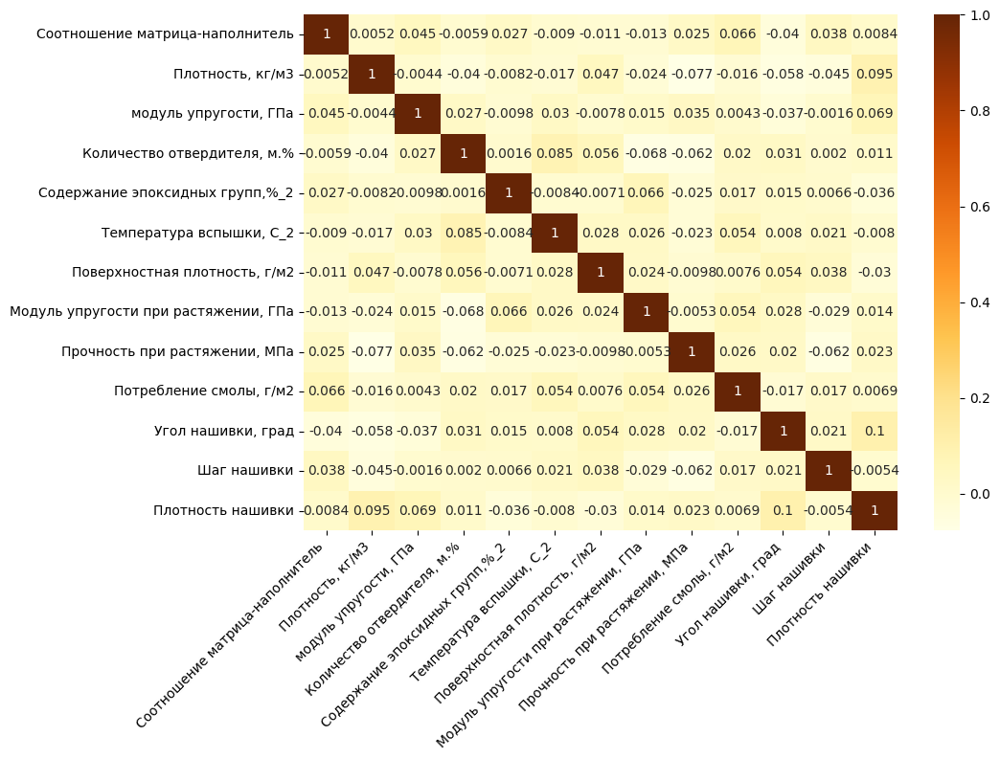

In [57]:
f, ax = plt.subplots(figsize = (10, 7))
sns.heatmap(df_standart.corr(), annot = True, cmap = 'YlOrBr')
plt.xticks(rotation = 45, ha='right')
plt.show()
# На тепловой карте видно, что корреляция осталась на том же уровне

# Подготовка к обучению моделей


In [58]:
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
df = x_bp.join(x_nup, how = 'inner')
df.to_excel('data_inner.xlsx')
df = pd.read_excel('data_inner.xlsx', index_col = 0)
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [59]:
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [60]:
df_filtered = df
cols = df_filtered.select_dtypes('number').columns 
df_sub = df_filtered.loc[:, cols]
# Межквартильный диапазон - iqr filter (2.22 эквивалентно z-оценке = 3)
iqr = df_sub.quantile(0.75, numeric_only = False) - df_sub.quantile(0.25, numeric_only = False)
lim = np.abs((df_sub - df_sub.median()) / iqr) < 2.22
# Удаление строк с выбросами
df_filtered.loc[:, cols] = df_sub.where(lim, np.nan)
df_filtered.dropna(inplace = True)

In [61]:
df_filtered

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [119]:
# 1 задача
y1_columns = ['Модуль упругости при растяжении, ГПа']
x1_columns = [
  'Соотношение матрица-наполнитель', 
  'Плотность, кг/м3',
  'модуль упругости, ГПа', 
  'Количество отвердителя, м.%',
  'Содержание эпоксидных групп,%_2', 
  'Температура вспышки, С_2',
  'Поверхностная плотность, г/м2', 
  'Потребление смолы, г/м2',
  'Угол нашивки, град', 
  'Шаг нашивки', 
  'Плотность нашивки'
]
y1 = df_filtered.loc[:, y1_columns]
x1 = df_filtered.loc[:, x1_columns]

In [120]:
# 2 задача
y2_columns = ['Прочность при растяжении, МПа']
x2_columns = [
  'Соотношение матрица-наполнитель', 
  'Плотность, кг/м3',
  'модуль упругости, ГПа', 
  'Количество отвердителя, м.%',
  'Содержание эпоксидных групп,%_2', 
  'Температура вспышки, С_2',
  'Поверхностная плотность, г/м2', 
  'Потребление смолы, г/м2',
  'Угол нашивки, град', 
  'Шаг нашивки', 
  'Плотность нашивки'
]
y2 = df_filtered.loc[:, y2_columns]
x2 = df_filtered.loc[:, x2_columns]

In [121]:
# 3 задача для нейронной сети
y3_columns = ['Соотношение матрица-наполнитель']
x3_columns = [
  'Плотность, кг/м3',
  'модуль упругости, ГПа', 
  'Количество отвердителя, м.%',
  'Содержание эпоксидных групп,%_2', 
  'Температура вспышки, С_2',
  'Поверхностная плотность, г/м2', 
  'Модуль упругости при растяжении, ГПа',
  'Прочность при растяжении, МПа', 
  'Потребление смолы, г/м2',
  'Угол нашивки, град', 
  'Шаг нашивки', 
  'Плотность нашивки'
]
y3 = df_filtered.loc[:, y3_columns]
x3 = df_filtered.loc[:, x3_columns]

In [122]:
# Деление переменных на категориальные и численные
x_categorical = ['Угол нашивки, град']
x1_continuous = [column for column in x1_columns if column not in x_categorical]
x2_continuous = [column for column in x2_columns if column not in x_categorical]
x3_continuous = [column for column in x3_columns if column not in x_categorical]

In [123]:
# Препроцессор для 1-й задачи
preprocessor1 = ColumnTransformer(transformers=[
        ("continuous", StandardScaler(), x1_continuous),
        ("categorical", OrdinalEncoder(), x_categorical)
])

In [124]:
# Препроцессор для 2-й задачи
preprocessor2 = ColumnTransformer(transformers=[
        ("continuous", StandardScaler(), x2_continuous),
        ("categorical", OrdinalEncoder(), x_categorical)
])

In [125]:
# Препроцессор для 3-й задачи
preprocessor3 = ColumnTransformer(transformers=[
        ("continuous", StandardScaler(), x3_continuous),
        ("categorical", OrdinalEncoder(), x_categorical)
])

In [126]:
# Разделение выборки на обучающую и тестовую
x_train1, x_test1, y_train1, y_test1 = train_test_split(x1, y1, test_size = 0.3, random_state = 0)
x_train2, x_test2, y_train2, y_test2 = train_test_split(x2, y2, test_size = 0.3, random_state = 0)
x_train3, x_test3, y_train3, y_test3 = train_test_split(x3, y3, test_size = 0.3, random_state = 0)
print('x_train1:', x_train1.shape, 'y_train1:', y_train1.shape)
print('x_test1:', x_test1.shape, 'y_test1:', y_test1.shape)
print('x_train2:', x_train2.shape, 'y_train2:', y_train2.shape)
print('x_test2:', x_test2.shape, 'y_test2:', y_test2.shape)
print('x_train3:', x_train3.shape, 'y_train3:', y_train3.shape)
print('x_test3:', x_test3.shape, 'y_test3:', y_test3.shape)

x_train1: (694, 11) y_train1: (694, 1)
x_test1: (298, 11) y_test1: (298, 1)
x_train2: (694, 11) y_train2: (694, 1)
x_test2: (298, 11) y_test2: (298, 1)
x_train3: (694, 12) y_train3: (694, 1)
x_test3: (298, 12) y_test3: (298, 1)


In [70]:
# Функция для запуска и сравнения моделей
def run_models(models, x, y):
    stat = pd.DataFrame()
    cv = KFold(10, shuffle = True, random_state = 0)
    scoring = ['r2', 
                'max_error', 
                'neg_root_mean_squared_error', 
                'neg_mean_absolute_error', 
                'neg_mean_absolute_percentage_error']
    for model_name, model in models.items():
        scores = cross_validate(model, x, y, cv = cv, scoring = scoring)
        stat.loc[model_name, 'R2'] = scores['test_r2'].mean()
        stat.loc[model_name, 'RMSE'] = scores['test_neg_root_mean_squared_error'].mean()
        stat.loc[model_name, 'MAE'] = scores['test_neg_mean_absolute_error'].mean()
        stat.loc[model_name, 'MAPE'] = scores['test_neg_mean_absolute_percentage_error'].mean()
        stat.loc[model_name, 'max_error'] = scores['test_max_error'].mean()
    return stat

In [71]:
# Функция для подбора гиперпараметров
def run_grid_search(model, params, x, y):
    pd.options.display.max_colwidth = 200
    stat = pd.DataFrame()
    cv = KFold(10, shuffle = True, random_state = 0)
    scoring = 'neg_mean_absolute_error'
    searcher = GridSearchCV(model, params, cv = cv, scoring = scoring)
    searcher.fit(x, y)
    stat.loc[:, 'rank_test_score'] = searcher.cv_results_['rank_test_score']
    stat.loc[:, 'params'] = searcher.cv_results_['params']
    stat.loc[:, 'MAE'] = searcher.cv_results_['mean_test_score']
    return stat, searcher.best_estimator_

In [72]:
# Функция для оценки моделей
def get_metrics(model_name, y, y_pred):
    stat = pd.DataFrame()
    stat.loc[model_name, 'R2'] = metrics.r2_score(y, y_pred)
    stat.loc[model_name, 'RMSE'] = metrics.mean_squared_error(y, y_pred, squared = False) * -1
    stat.loc[model_name, 'MAE'] = metrics.mean_absolute_error(y, y_pred) * -1
    stat.loc[model_name, 'MAPE'] = metrics.mean_absolute_percentage_error(y, y_pred) * -1
    stat.loc[model_name, 'max_error'] = metrics.max_error(y, y_pred) * -1
    return stat

## Модель для модуля упругости при растяжении, ГПа

In [73]:
# Предобработка данных
x_train1 = preprocessor1.fit_transform(x_train1)
x_test1 = preprocessor1.transform(x_test1)

In [74]:
y_train1 = y_train1['Модуль упругости при растяжении, ГПа'].values
y_test1 = y_test1['Модуль упругости при растяжении, ГПа'].values

In [75]:
# Сравнение моделей с параметрами по умолчанию
def_models1 = {
    'DummyRegressor': DummyRegressor(),  # По умолчанию предсказывает среднее значение, используется для оценки других моделей
    'LinearRegression': LinearRegression(), # Линейная регрессия
    'Ridge': Ridge(), # Гребневая регрессия
    'Lasso': Lasso(), # Лассо
    'SVR': SVR(), # Метод опорных векторов
    'KNeighborsRegressor': KNeighborsRegressor(), # Метод k-ближайших соседей
    'DecisionTreeRegressor': DecisionTreeRegressor(random_state = 0), # Деревья решений
    'RandomForestRegressor': RandomForestRegressor(random_state = 0), # Случайный лес
    'GradientBoostingRegressor': GradientBoostingRegressor(random_state = 0) # Градиентный бустинг
}
stat1_1 = run_models(def_models1, x_train1, y_train1)
stat1_1.style.highlight_max(axis = 0)

,R2,RMSE,MAE,MAPE,max_error
DummyRegressor,-0.025801,-3.013795,-2.408483,-0.032937,-7.702150
LinearRegression,-0.040280,-3.033795,-2.419878,-0.033087,-7.785673
Ridge,-0.040201,-3.033684,-2.419806,-0.033087,-7.785518
Lasso,-0.025801,-3.013795,-2.408483,-0.032937,-7.702150
SVR,-0.064043,-3.067918,-2.446795,-0.033437,-7.896264
KNeighborsRegressor,-0.218550,-3.279741,-2.632233,-0.035947,-8.352322
DecisionTreeRegressor,-1.228511,-4.423601,-3.583321,-0.048992,-11.451281
RandomForestRegressor,-0.087091,-3.100472,-2.472667,-0.033824,-8.005775
GradientBoostingRegressor,-0.155287,-3.197943,-2.524645,-0.034507,-8.531914


In [76]:
# Подбор параметров и поиск лучшей модели
search_models1 = {}

In [77]:
# Для модели Ridge
params1 = [
  {
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
    'alpha': range(10, 1510, 10)
  },           
  {
    'solver': ['lbfgs'],
    'alpha': range(10, 1510, 10),
    'positive': [True]
  }
]
search, smodel = run_grid_search(Ridge(), params1, x_train1, y_train1)
search_models1[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
1090,1,"{'alpha': 410, 'positive': True, 'solver': 'lbfgs'}",-2.40256


In [79]:
# Для модели Lasso
params1 = [
  {
    'alpha': [0.001, 0.005, 0.01, 0.05, 0.095, 0.1, 0.150, 0.2, 0.5, 1, 5]
  }
]
search, smodel = run_grid_search(Lasso(), params1, x_train1, y_train1)
search_models1[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
5,1,{'alpha': 0.1},-2.405317


In [80]:
# Для модели SVR
params1 = [
    {
      'kernel': ['linear'],
      'C': [0.001, 0.005, 0.01, 0.015, 0.02, 0.03, 0.04, 0.05]
    },
    {
      'kernel': ['poly'],
      'C': [0.001, 0.01, 0.02, 0.03, 0.04, 0.05]
    },
    {
      'kernel': ['rbf'],
      'C': [0.01, 0.02, 0.03, 0.04, 0.05]
    },
    {
      'kernel': ['sigmoid'],
      'C': [0.01, 0.02, 0.03, 0.04, 0.5]
    }
]
search, smodel = run_grid_search(SVR(), params1, x_train1, y_train1)
search_models1[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
13,1,"{'C': 0.05, 'kernel': 'poly'}",-2.397686


In [81]:
# Для модели KNeighborsRegressor
params1 = {
    'n_neighbors': range(3, 60, 2)
}
search, smodel = run_grid_search(KNeighborsRegressor(), params1, x_train1, y_train1)
search_models1[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
25,1,{'n_neighbors': 53},-2.416598


In [82]:
# Для модели DecisionTreeRegressor
params1 = {
    'random_state': [0],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter': ['best', 'random'],
    'max_depth': [1, 2, 3],
    'max_features': range(1, 11, 1)
}
search, smodel = run_grid_search(DecisionTreeRegressor(), params1, x_train1, y_train1)
search_models1[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
29,1,"{'criterion': 'squared_error', 'max_depth': 2, 'max_features': 5, 'random_state': 0, 'splitter': 'random'}",-2.387448
89,1,"{'criterion': 'friedman_mse', 'max_depth': 2, 'max_features': 5, 'random_state': 0, 'splitter': 'random'}",-2.387448
209,1,"{'criterion': 'poisson', 'max_depth': 2, 'max_features': 5, 'random_state': 0, 'splitter': 'random'}",-2.387448


In [83]:
# Для модели RandomForestRegressor
params1 = {
    'random_state': [0],
    'n_estimators': [50, 100], 
    'criterion': ['absolute_error'],
    'max_depth': [2, 3, 4, 5],
    'max_features': [1, 2, 11],
    'bootstrap': [False]
}
search, smodel = run_grid_search(RandomForestRegressor(), params1, x_train1, y_train1)
search_models1[str(smodel)] = smodel
search[search['rank_test_score'] == 10]

,rank_test_score,params,MAE
6,10,"{'bootstrap': False, 'criterion': 'absolute_error', 'max_depth': 3, 'max_features': 1, 'n_estimators': 50, 'random_state': 0}",-2.421109


In [84]:
# для модели GradientBoostingRegressor
params1 = {
    'random_state': [0],
    'loss': ['squared_error', 'absolute_error'], 
    #'criterion': ['friedman_mse', 'squared_error'],
    'n_estimators': [50, 100, 150],
    'max_depth': [1, 2, 3],
    'max_features': [1, 2, 5, 11]    
}
search, smodel = run_grid_search(GradientBoostingRegressor(), params1, x_train1, y_train1)
search_models1[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
0,1,"{'loss': 'squared_error', 'max_depth': 1, 'max_features': 1, 'n_estimators': 50, 'random_state': 0}",-2.420581


In [85]:
# Сравнение моделей с подобранными параметрами, поиск лучшей
stat1_2 = run_models(search_models1, x_train1, y_train1)
stat1_2.style.highlight_max(axis = 0)

,R2,RMSE,MAE,MAPE,max_error
"Ridge(alpha=410, positive=True, solver='lbfgs')",-0.028041,-3.016480,-2.402560,-0.032854,-7.739427
Lasso(alpha=0.1),-0.028228,-3.017201,-2.405317,-0.032891,-7.738947
"SVR(C=0.05, kernel='poly')",-0.021899,-3.007710,-2.397686,-0.032754,-7.738811
KNeighborsRegressor(n_neighbors=53),-0.037535,-3.030675,-2.416598,-0.033056,-7.720174
"DecisionTreeRegressor(max_depth=2, max_features=5, random_state=0, splitter='random')",-0.011775,-2.991498,-2.387448,-0.032646,-7.755630
"RandomForestRegressor(bootstrap=False, criterion='absolute_error', max_depth=4, max_features=1, n_estimators=50, random_state=0)",-0.035630,-3.028397,-2.411007,-0.032948,-7.862964
"GradientBoostingRegressor(max_depth=1, max_features=1, n_estimators=50, random_state=0)",-0.046504,-3.044165,-2.420581,-0.033099,-7.861759


In [86]:
# Предсказание базовой модели
base_model1 = DummyRegressor()
base_model1.fit(x_train1, y_train1)
y1_pred_base = base_model1.predict(x_test1)

In [87]:
# Предсказание лучшей модели
best_model1 = DecisionTreeRegressor(criterion = 'absolute_error', max_depth = 2, max_features = 5, random_state = 0, splitter = 'random')
best_model1.fit(x_train1, y_train1)
y1_pred_best = best_model1.predict(x_test1)

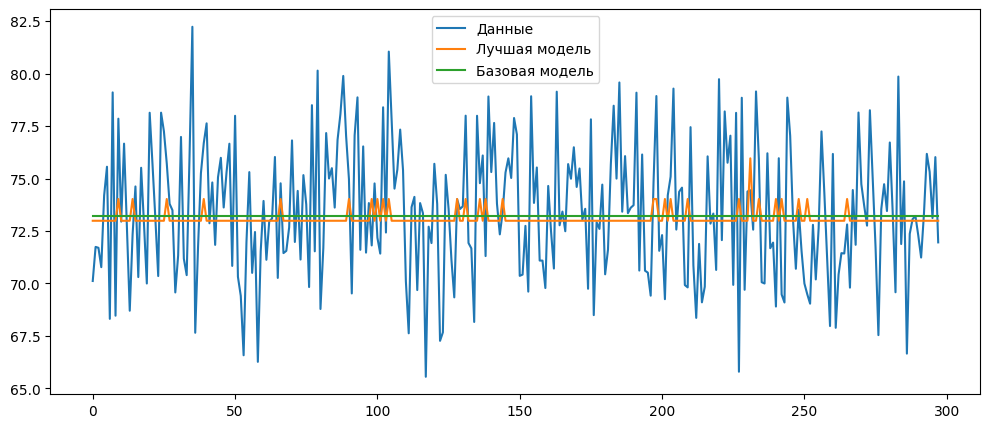

In [88]:
# Визуализация
fig, ax = plt.subplots(figsize = (12, 5))
ax.plot(y_test1, label = 'Данные')
ax.plot(y1_pred_best, label = 'Лучшая модель')
ax.plot(y1_pred_base, label = 'Базовая модель')
ax.legend()
plt.show()

In [94]:
# Сравнение предсказаний базовой модели и лучшей модели на тестовом множестве
compare1 = get_metrics('Базовая модель', y_test1, y1_pred_base)
compare1_1 = get_metrics('Лучшая модель (дерево решений)', y_test1, y1_pred_best)
compare1 = pd.concat([compare1, compare1_1])
compare1

,R2,RMSE,MAE,MAPE,max_error
Базовая модель,-0.004581,-3.184357,-2.599556,-0.035346,-9.006040
Лучшая модель (дерево решений),-0.016276,-3.202838,-2.601556,-0.035307,-9.247423


## Модель для прочности при растяжении, МПа

In [95]:
x_test2 = preprocessor2.fit_transform(x_test2)
x_train2 = preprocessor2.transform(x_train2)

In [96]:
y_train2 = y_train2['Прочность при растяжении, МПа'].values
y_test2 = y_test2['Прочность при растяжении, МПа'].values

In [97]:
# Запуск моделей с параметрами по умолчанию
models2_def = {
    'DummyRegressor': DummyRegressor(),
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'SVR': SVR(),
    'DecisionTreeRegressor': DecisionTreeRegressor(random_state = 0),
    'RandomForestRegressor': RandomForestRegressor(random_state = 0),
    'GradientBoostingRegressor': GradientBoostingRegressor(random_state = 0)    
}

stat2_1 = run_models(models2_def, x_train2, y_train2)
stat2_1.style.highlight_max(axis = 0)

,R2,RMSE,MAE,MAPE,max_error
DummyRegressor,-0.026342,-484.807293,-380.185919,-0.167277,-1253.431489
LinearRegression,-0.033167,-486.474961,-385.238945,-0.168730,-1258.639354
Ridge,-0.033108,-486.460907,-385.220677,-0.168723,-1258.607692
Lasso,-0.032865,-486.404296,-384.988615,-0.168664,-1258.645065
SVR,-0.026718,-484.947303,-380.218028,-0.166329,-1262.072451
DecisionTreeRegressor,-1.069986,-682.369273,-545.666323,-0.234120,-1773.372125
RandomForestRegressor,-0.078820,-496.382732,-399.731376,-0.174450,-1243.269911
GradientBoostingRegressor,-0.148984,-511.332319,-409.803025,-0.178062,-1291.511611


In [98]:
search_models2 = {}

In [99]:
# для модели Ridge
params2 = [
  {
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg'],
    'alpha': range(10, 1000, 10)
  },
  {
    'solver': ['sag', 'saga'],
    'alpha': range(10, 1000, 10),
    'random_state': [0]
  },
  {
    'solver': ['lbfgs'],
    'alpha': range(10, 1000, 10),
    'positive': [True]
  }
]
search, smodel = run_grid_search(Ridge(), params2, x_train2, y_train2)
search_models2[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
791,1,"{'alpha': 990, 'positive': True, 'solver': 'lbfgs'}",-380.018387


In [100]:
# для модели Lasso
params2 = [
  {
    'alpha': [0.1, 1, 5, 10, 20, 30, 40, 50, 60, 100]
  }
]
search, smodel = run_grid_search(Lasso(), params2, x_train2, y_train2)
search_models2[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
7,1,{'alpha': 50},-380.185919
8,1,{'alpha': 60},-380.185919
9,1,{'alpha': 100},-380.185919


In [101]:
# для модели SVR
params2 = [
    {
      'kernel': ['linear'],
      'C': [0.001, 0.01, 0.02]
    },
    {
      'kernel': ['poly'],
      'C': [0.001, 0.01, 0.02]
    },
    {
      'kernel': ['rbf'],
      'gamma': ['scale', 'auto'],
      'C': [0.01, 0.05, 0.1, 0.2, 0.3]
    },
    {
      'kernel': ['sigmoid'],
      'C': [0.001, 0.01, 0.1]
    }
]

search, smodel = run_grid_search(SVR(), params2, x_train2, y_train2)
search_models2[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
16,1,"{'C': 0.001, 'kernel': 'sigmoid'}",-379.936358


In [102]:
# для DecisionTreeRegressor
params2 = {
    'random_state': [0],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter': ['best', 'random'],
    'max_depth': [1, 2, 3],
    'max_features': range(1, 11, 1)
}
search, smodel = run_grid_search(DecisionTreeRegressor(), params2, x_train2, y_train2)
search_models2[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
128,1,"{'criterion': 'absolute_error', 'max_depth': 1, 'max_features': 5, 'random_state': 0, 'splitter': 'best'}",-378.716225
130,1,"{'criterion': 'absolute_error', 'max_depth': 1, 'max_features': 6, 'random_state': 0, 'splitter': 'best'}",-378.716225


In [103]:
# Для модели RandomForestRegressor
params2 = {
    'random_state': [0],
    'n_estimators': [50, 100], 
    'criterion': ['absolute_error'],
    'max_depth': [2, 3, 4, 5],
    'max_features': [1, 2, 11],
    'bootstrap': [False]
}
search, smodel = run_grid_search(RandomForestRegressor(), params2, x_train2, y_train2)
search_models2[str(smodel)] = smodel
search[search['rank_test_score'] == 10]

,rank_test_score,params,MAE
8,10,"{'bootstrap': False, 'criterion': 'absolute_error', 'max_depth': 3, 'max_features': 2, 'n_estimators': 50, 'random_state': 0}",-383.597616


In [104]:
# для модели GradientBoostingRegressor
params2 = {
    'random_state': [0],
    'loss': ['squared_error', 'absolute_error'], 
    'n_estimators': [50, 100, 150],
    'max_depth': [1, 2, 3],
    'max_features': [1, 2, 5, 11]    
}
search, smodel = run_grid_search(GradientBoostingRegressor(), params2, x_train2, y_train2)
search_models2[str(smodel)] = smodel
search[search['rank_test_score'] == 1]

,rank_test_score,params,MAE
0,1,"{'loss': 'squared_error', 'max_depth': 1, 'max_features': 1, 'n_estimators': 50, 'random_state': 0}",-382.902477


In [105]:
# Сравнение моделей с подобранными параметрами, поиск лучшей
stat2_2 = run_models(search_models2, x_train2, y_train2)
stat2_2.style.highlight_max(axis = 0)

,R2,RMSE,MAE,MAPE,max_error
"Ridge(alpha=990, positive=True, solver='lbfgs')",-0.023267,-484.113037,-380.018387,-0.167120,-1257.022616
Lasso(alpha=50),-0.026342,-484.807293,-380.185919,-0.167277,-1253.431489
"SVR(C=0.001, kernel='sigmoid')",-0.026311,-484.853433,-379.936358,-0.166191,-1261.977540
"DecisionTreeRegressor(criterion='absolute_error', max_depth=1, max_features=5, random_state=0)",-0.026397,-484.768578,-378.716225,-0.166234,-1255.193290
"RandomForestRegressor(bootstrap=False, criterion='absolute_error', max_depth=2, max_features=1, n_estimators=50, random_state=0)",-0.020263,-483.477346,-380.126241,-0.166222,-1248.234411
"GradientBoostingRegressor(max_depth=1, max_features=1, n_estimators=50, random_state=0)",-0.032345,-486.308546,-382.902477,-0.168049,-1244.425207


In [106]:
# Предсказание базовой модели
base_model2 = DummyRegressor()
base_model2.fit(x_train2, y_train2)
y2_pred_base = base_model2.predict(x_test2)

In [107]:
# Предсказание лучшей модели
best_model2 = RandomForestRegressor(bootstrap = False, criterion = 'absolute_error', max_depth = 2, max_features = 1, n_estimators = 50, random_state = 0)
best_model2.fit(x_train2, y_train2)
y2_pred_best = best_model2.predict(x_test2)

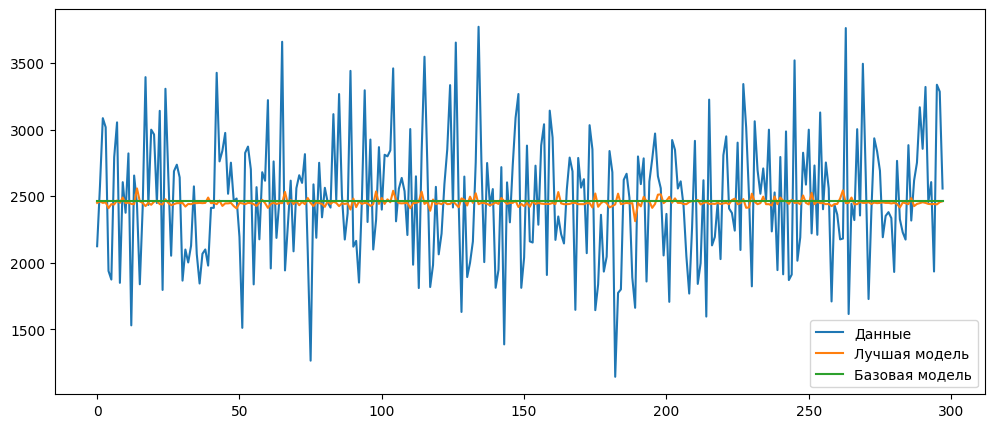

In [108]:
# Визуализация
fig, ax = plt.subplots(figsize = (12, 5))
ax.plot(y_test2, label = 'Данные')
ax.plot(y2_pred_best, label = 'Лучшая модель')
ax.plot(y2_pred_base, label = 'Базовая модель')
ax.legend()
plt.show()

In [110]:
# Сравнение предсказаний базовой модели и лучшей модели на тестовом множестве
compare2 = get_metrics('Базовая модель', y_test2, y2_pred_base)
compare2_1 = get_metrics('Лучшая модель (Случайный лес)', y_test2, y2_pred_best)
compare2 = pd.concat([compare2, compare2_1])
compare2

,R2,RMSE,MAE,MAPE,max_error
Базовая модель,-0.002151,-474.683874,-382.633231,-0.164142,-1317.160974
Лучшая модель (Случайный лес),-0.013125,-477.275842,-385.630487,-0.164716,-1332.911750


## Создание нейросети для соотношения матрица-наполнитель

In [127]:
y_train3

,Соотношение матрица-наполнитель
270,2.192099
910,3.683190
480,1.934061
1010,1.807046
960,4.240160
...,...
863,3.710895
200,4.039910
654,2.765952
582,3.228435


In [128]:
y_test3

,Соотношение матрица-наполнитель
847,1.047844
747,4.660319
34,2.916150
666,2.364729
389,2.503263
...,...
110,3.490162
72,2.538869
489,3.298268
949,4.235150


In [129]:
x_test3 = preprocessor3.fit_transform(x_test3)
x_train3 = preprocessor3.transform(x_train3)

In [130]:
y_train3 = y_train3['Соотношение матрица-наполнитель'].values
y_test3 = y_test3['Соотношение матрица-наполнитель'].values

In [131]:
# Базовая модель DummyRegressor, возвращающая среднее, будет использоваться для оценки качества работы нейросети.
base_model3 = DummyRegressor()

In [132]:
# Предсказание базовой модели
base_model3.fit(x_train3, y_train3)
y3_pred_base = base_model3.predict(x_test3)

In [134]:
# Настройка нейросети 
model3_1 = MLPRegressor(
    hidden_layer_sizes = (8, 8),
    activation = 'relu',
    solver = 'adam',
    max_iter = 5000,
    early_stopping = True,
    validation_fraction = 0.3,
    random_state = 0, 
    verbose = True
)

In [135]:
# Запуск нейросеть
model3_1.fit(x_train3, y_train3)

Iteration 1, loss = 4.37585217
Validation score: -10.288614
Iteration 2, loss = 4.22862294
Validation score: -9.891254
Iteration 3, loss = 4.08978918
Validation score: -9.507950
Iteration 4, loss = 3.95390420
Validation score: -9.142314
Iteration 5, loss = 3.82530280
Validation score: -8.791721
Iteration 6, loss = 3.70427604
Validation score: -8.453666
Iteration 7, loss = 3.58710060
Validation score: -8.129943
Iteration 8, loss = 3.47405172
Validation score: -7.820728
Iteration 9, loss = 3.36419675
Validation score: -7.526553
Iteration 10, loss = 3.26219108
Validation score: -7.244674
Iteration 11, loss = 3.16162668
Validation score: -6.976607
Iteration 12, loss = 3.06485414
Validation score: -6.721070
Iteration 13, loss = 2.97109959
Validation score: -6.475213
Iteration 14, loss = 2.88293567
Validation score: -6.235018
Iteration 15, loss = 2.79520738
Validation score: -6.003666
Iteration 16, loss = 2.71125686
Validation score: -5.780345
Iteration 17, loss = 2.62820762
Validation score

MLPRegressor(early_stopping=True, hidden_layer_sizes=(8, 8), max_iter=5000,
             random_state=0, validation_fraction=0.3, verbose=True)

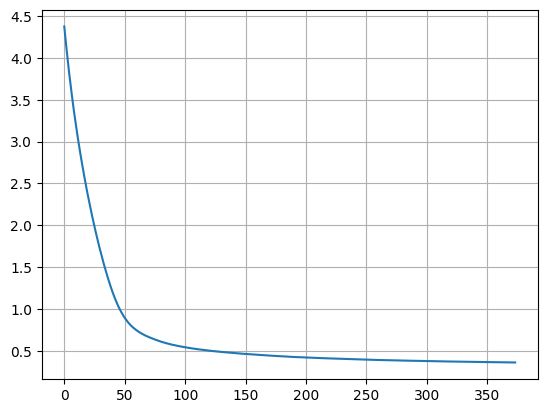

In [136]:
# График ошибки
plt.plot(model3_1.loss_curve_)
plt.grid(True)
plt.show()

In [137]:
# Предсказание нейросети
y3_pred_skl = model3_1.predict(x_test3)

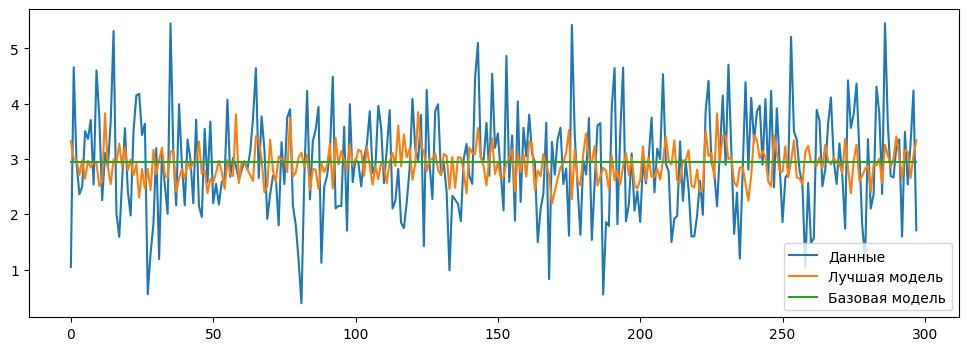

In [138]:
# Визуализация
fig, ax = plt.subplots(figsize = (12, 4))
ax.plot(y_test3, label = 'Данные')
ax.plot(y3_pred_skl, label = 'Лучшая модель')
ax.plot(y3_pred_base, label = 'Базовая модель')
ax.legend()
plt.show()

In [140]:
# Сравнение предсказаний базовой модели и лучшей модели на тестовом множестве
compare3 = get_metrics('DummyRegressor', y_test3, y3_pred_base)
compare3_1 = get_metrics('MLPRegressor', y_test3, y3_pred_skl)
compare3 = pd.concat([compare3, compare3_1])
compare3

,R2,RMSE,MAE,MAPE,max_error
DummyRegressor,-0.001195,-0.938472,-0.747204,-0.348824,-2.556776
MLPRegressor,-0.053299,-0.962583,-0.763131,-0.348466,-3.153270


In [142]:
# Другая нейронная сеть из библиотеки TensorFlow.
# Функция, собирающая нейросеть заданной архитектуры
def construct_model():
    return tf.keras.Sequential([
      keras.layers.Input(shape = (12,), name = 'in'),                   
      keras.layers.Dense(units = 8, activation = 'relu', name = 'dense_1'),
      keras.layers.Dense(units = 8, activation = 'relu', name = 'dense_2'),
      keras.layers.Dense(units = 1, name = 'out')                        
    ])

In [143]:
# Функция, компилирующая нейросеть с заданными параметрами
def compile_model(model):
    model.compile(
      optimizer = keras.optimizers.Adam(),
      loss = keras.losses.MeanAbsolutePercentageError(),
      metrics = [tf.keras.metrics.RootMeanSquaredError()]
    )
    return model

In [144]:
# Функция для построения графика ошибки
def plot_loss(history):
  fig, axes = plt.subplots(1, 2, figsize = (12, 5))
  axes[0].plot(history['loss'], label = 'loss')
  axes[0].plot(history['val_loss'], label = 'val_loss')
  axes[0].set_xlabel('Эпоха')
  axes[0].set_ylabel('MAPE')
  axes[0].legend()
  axes[0].grid(True)
  axes[1].plot(history['root_mean_squared_error'], label = 'loss')
  axes[1].plot(history['val_root_mean_squared_error'], label = 'val_loss')
  axes[1].set_xlabel('Эпоха')
  axes[1].set_ylabel('RMSE')
  axes[1].legend()
  axes[1].grid(True)
  plt.show()

In [145]:
# Сборка нейросеть
model3_2 = construct_model()

In [146]:
# Компиляция нейросети
model3_2 = compile_model(model3_2)

In [147]:
# Сводная информация по архитектуре сети
model3_2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 8)                 104       
                                                                 
 dense_2 (Dense)             (None, 8)                 72        
                                                                 
 out (Dense)                 (None, 1)                 9         
                                                                 
Total params: 185
Trainable params: 185
Non-trainable params: 0
_________________________________________________________________


In [148]:
#Обучение нейросети
history = model3_2.fit(
  x_train3, 
  y_train3, 
  epochs = 50, 
  validation_split = 0.3, 
  verbose = 1
)

Epoch 1/50
16/16 [==============================] - 1s 10ms/step - loss: 124.5006 - root_mean_squared_error: 3.7732 - val_loss: 119.9902 - val_root_mean_squared_error: 3.5596
Epoch 2/50
16/16 [==============================] - 0s 3ms/step - loss: 115.4215 - root_mean_squared_error: 3.5286 - val_loss: 111.4240 - val_root_mean_squared_error: 3.3425
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 107.1210 - root_mean_squared_error: 3.3201 - val_loss: 103.4565 - val_root_mean_squared_error: 3.1440
Epoch 4/50
16/16 [==============================] - 0s 3ms/step - loss: 99.3405 - root_mean_squared_error: 3.1218 - val_loss: 95.7710 - val_root_mean_squared_error: 2.9566
Epoch 5/50
16/16 [==============================] - 0s 3ms/step - loss: 91.5645 - root_mean_squared_error: 2.9374 - val_loss: 88.1505 - val_root_mean_squared_error: 2.7737
Epoch 6/50
16/16 [==============================] - 0s 3ms/step - loss: 83.9705 - root_mean_squared_error: 2.7546 - val_loss: 80.5760

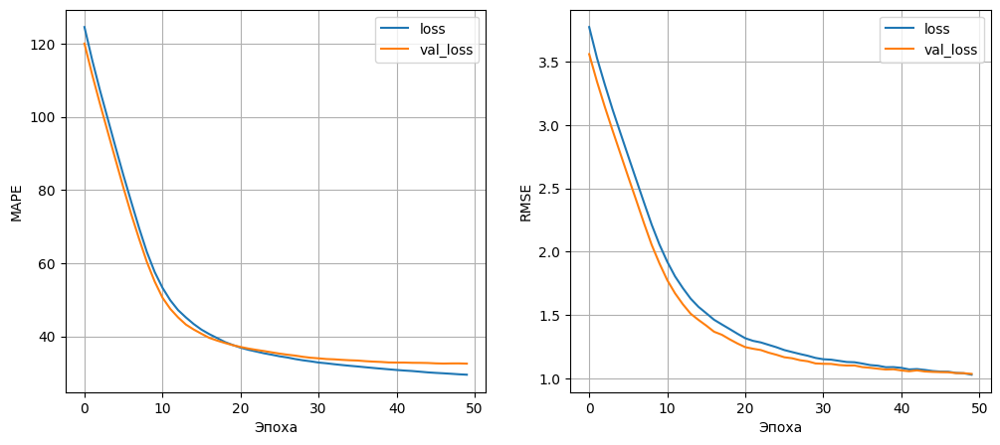

In [149]:
plot_loss(history.history)

In [150]:
# Проверяем точность нейросети на тестовых данных
model3_2.evaluate(x_test3, y_test3)

10/10 [==============================] - 0s 977us/step - loss: 34.7803 - root_mean_squared_error: 1.0988


[34.78026580810547, 1.0987927913665771]

In [151]:
# Предсказание 
y3_pred_keras2 = model3_2.predict(x_test3)

10/10 [==============================] - 0s 667us/step


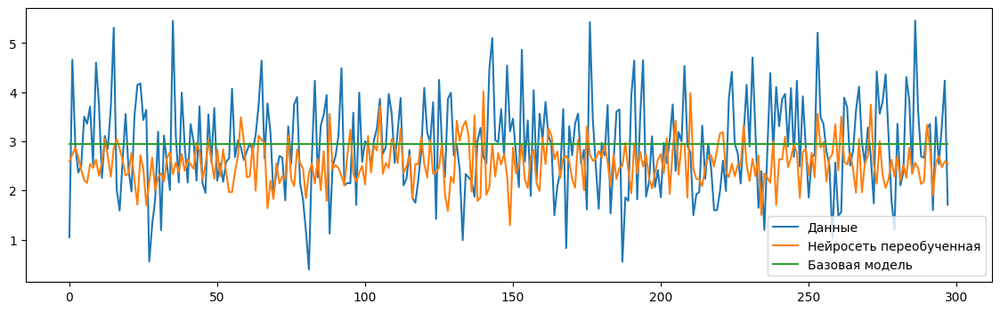

In [152]:
# Визуализация
fig, ax = plt.subplots(figsize = (14, 4))
ax.plot(y_test3, label = 'Данные')
ax.plot(y3_pred_keras2, label = 'Нейросеть переобученная')
ax.plot(y3_pred_base, label = 'Базовая модель')
ax.legend()
plt.show()

In [153]:
# Создаем модель с той же архитектурой
model3_3 = construct_model()
model3_3 = compile_model(model3_3)

In [154]:
#Обучение нейросети
history = model3_3.fit(
  x_train3, 
  y_train3, 
  epochs = 50, 
  validation_split = 0.3, 
  verbose = 1,
  callbacks = [keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 3)]
)

Epoch 1/50
16/16 [==============================] - 1s 8ms/step - loss: 77.7786 - root_mean_squared_error: 2.5513 - val_loss: 75.9204 - val_root_mean_squared_error: 2.4640
Epoch 2/50
16/16 [==============================] - 0s 2ms/step - loss: 71.7116 - root_mean_squared_error: 2.4025 - val_loss: 70.1835 - val_root_mean_squared_error: 2.3143
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 65.1286 - root_mean_squared_error: 2.2342 - val_loss: 63.7576 - val_root_mean_squared_error: 2.1430
Epoch 4/50
16/16 [==============================] - 0s 2ms/step - loss: 58.0122 - root_mean_squared_error: 2.0607 - val_loss: 57.2845 - val_root_mean_squared_error: 1.9659
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 51.5817 - root_mean_squared_error: 1.8763 - val_loss: 51.1338 - val_root_mean_squared_error: 1.7881
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 46.4313 - root_mean_squared_error: 1.7123 - val_loss: 46.1796 - val_

In [ ]:
plot_loss(history.history)

In [156]:
# Проверка точности нейросети на тестовых данных
model3_3.evaluate(x_test3, y_test3)

10/10 [==============================] - 0s 1ms/step - loss: 37.0424 - root_mean_squared_error: 1.1373


[37.042381286621094, 1.1373378038406372]

In [157]:
# Предсказание 
y3_pred_keras3 = model3_3.predict(x_test3)

10/10 [==============================] - 0s 829us/step


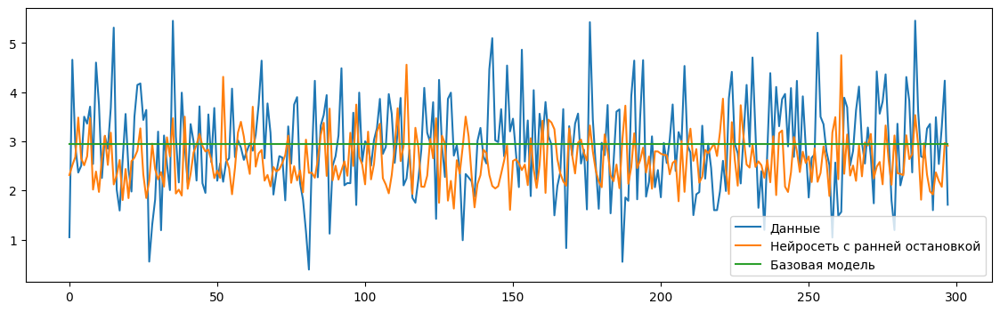

In [158]:
# Визуализация
fig, ax = plt.subplots(figsize = (14, 4))
ax.plot(y_test3, label = 'Данные')
ax.plot(y3_pred_keras3, label = 'Нейросеть с ранней остановкой')
ax.plot(y3_pred_base, label = 'Базовая модель')
ax.legend()
plt.show()

In [159]:
# Построение аналогичной модели с Dropout слоем
model3_4 = tf.keras.Sequential([
      keras.layers.Input(shape = (12,), name = 'in'),                   
      keras.layers.Dense(units = 8, activation = 'relu', name = 'dense_1'),
      keras.layers.Dropout(0.05, name = 'dropout_1'),
      keras.layers.Dense(units = 8, activation = 'relu', name = 'dense_2'),
      keras.layers.Dropout(0.05, name = 'dropout_2'),
      keras.layers.Dense(units=1, name = 'out')                        
    ])

In [160]:
# Компиляция модели
model3_4 = compile_model(model3_4)

In [161]:
# Архитектура изменилась
model3_4.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 8)                 104       
                                                                 
 dropout_1 (Dropout)         (None, 8)                 0         
                                                                 
 dense_2 (Dense)             (None, 8)                 72        
                                                                 
 dropout_2 (Dropout)         (None, 8)                 0         
                                                                 
 out (Dense)                 (None, 1)                 9         
                                                                 
Total params: 185
Trainable params: 185
Non-trainable params: 0
_________________________________________________________________


In [162]:
#Обучение нейросети
history = model3_4.fit(
  x_train3, 
  y_train3, 
  epochs = 50, 
  validation_split = 0.3, 
  verbose = 1
)

Epoch 1/50
16/16 [==============================] - 1s 8ms/step - loss: 84.6385 - root_mean_squared_error: 2.8128 - val_loss: 78.3955 - val_root_mean_squared_error: 2.5790
Epoch 2/50
16/16 [==============================] - 0s 3ms/step - loss: 76.2979 - root_mean_squared_error: 2.5638 - val_loss: 68.8661 - val_root_mean_squared_error: 2.3455
Epoch 3/50
16/16 [==============================] - 0s 3ms/step - loss: 68.2360 - root_mean_squared_error: 2.3498 - val_loss: 60.3850 - val_root_mean_squared_error: 2.1324
Epoch 4/50
16/16 [==============================] - 0s 3ms/step - loss: 60.8097 - root_mean_squared_error: 2.1509 - val_loss: 53.0590 - val_root_mean_squared_error: 1.9412
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 53.6898 - root_mean_squared_error: 1.9428 - val_loss: 48.2930 - val_root_mean_squared_error: 1.7866
Epoch 6/50
16/16 [==============================] - 0s 3ms/step - loss: 49.4697 - root_mean_squared_error: 1.8119 - val_loss: 45.6867 - val_

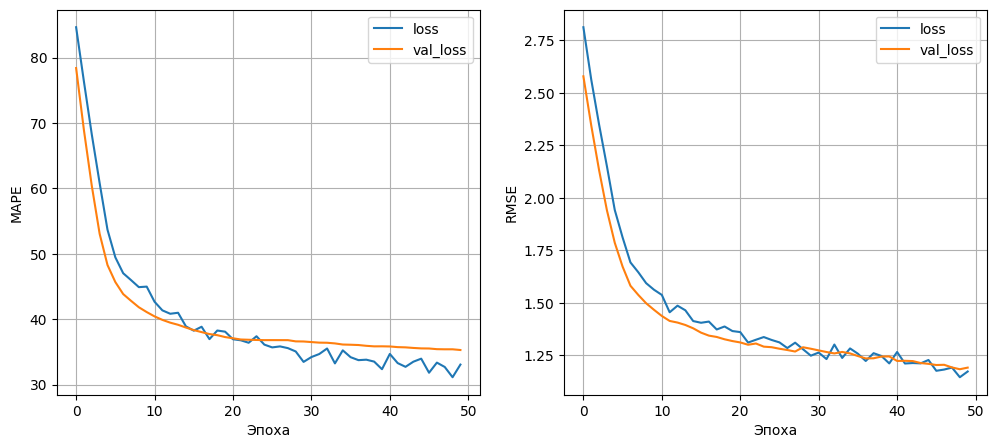

In [163]:
plot_loss(history.history)

In [164]:
# Проверяем точность нейросети на тестовых данных
model3_4.evaluate(x_test3, y_test3)

10/10 [==============================] - 0s 999us/step - loss: 36.5414 - root_mean_squared_error: 1.1919


[36.541358947753906, 1.1918631792068481]

In [165]:
# Предсказание 
y3_pred_keras4 = model3_4.predict(x_test3)

10/10 [==============================] - 0s 1ms/step


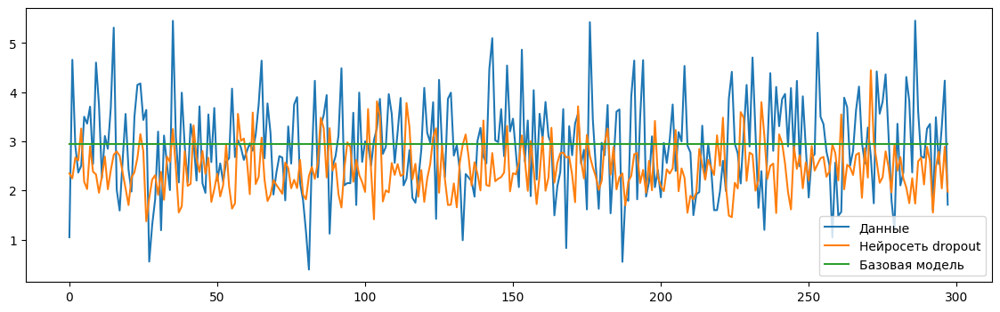

In [166]:
# Визуализация
fig, ax = plt.subplots(figsize = (14, 4))
ax.plot(y_test3, label = 'Данные')
ax.plot(y3_pred_keras4, label = 'Нейросеть dropout')
ax.plot(y3_pred_base, label = 'Базовая модель')
ax.legend()
plt.show()

In [170]:
# Сравнение предсказаний базовой модели и лучшей модели на тестовом множестве
compare3_2 = get_metrics('DummyRegressor', y_test3, y3_pred_base)
compare3_21 = get_metrics('Нейросеть переобученная', y_test3, y3_pred_keras2)
compare3_22 = get_metrics('Нейросеть с ранней остановкой', y_test3, y3_pred_keras3)
compare3_23 = get_metrics('Нейросеть dropout', y_test3, y3_pred_keras4)
compare3_2 = pd.concat([compare3_2, compare3_21, compare3_22, compare3_23])
compare3_2

,R2,RMSE,MAE,MAPE,max_error
DummyRegressor,-0.001195,-0.938472,-0.747204,-0.348824,-2.556776
Нейросеть переобученная,-0.372484,-1.098793,-0.875138,-0.347803,-3.121033
Нейросеть с ранней остановкой,-0.470465,-1.137338,-0.904499,-0.370424,-3.191731
Нейросеть dropout,-0.614836,-1.191863,-0.955809,-0.365414,-3.723045


In [171]:
## Модель для модуля упругости при растяжении
best_model1

DecisionTreeRegressor(criterion='absolute_error', max_depth=2, max_features=5,
                      random_state=0, splitter='random')

In [172]:
result1 = pd.DataFrame()
y1_pred_train = best_model1.predict(x_train1)
result1 = pd.concat([result1, get_metrics('Модуль упругости, тренировочный', y_train1, y1_pred_train)])
y1_pred_test = best_model1.predict(x_test1)
result1 = pd.concat([result1, get_metrics('Модуль упругости, тестовый', y_test1, y1_pred_test)])
result1

c:\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(


,R2,RMSE,MAE,MAPE,max_error
"Модуль упругости, тренировочный",-0.070012,-3.113712,-2.488748,-0.034386,-9.331630
"Модуль упругости, тестовый",-0.033492,-3.229852,-2.664655,-0.036614,-8.474695


In [173]:
## Модель для прочности при растяжении
best_model2

RandomForestRegressor(bootstrap=False, criterion='absolute_error', max_depth=2,
                      max_features=1, n_estimators=50, random_state=0)

In [174]:
result2 = pd.DataFrame()
y2_pred_train = best_model2.predict(x_train2)
result2 = pd.concat([result2, get_metrics('Прочность при растяжении, тренировочный', y_train2, y2_pred_train)])
y2_pred_test = best_model2.predict(x_test2)
result2 = pd.concat([result2, get_metrics('Прочность при растяжении, тестовый', y_test2, y2_pred_test)])
result2

c:\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


,R2,RMSE,MAE,MAPE,max_error
"Прочность при растяжении, тренировочный",-0.038099,-494.224318,-390.839742,-0.177936,-1484.395874
"Прочность при растяжении, тестовый",-0.020724,-479.062428,-382.887928,-0.170462,-1392.772897


In [175]:
## Модель для соотношения матрица-наполнитель
model3_4

In [176]:
result3 = pd.DataFrame()
y3_pred_train = model3_3.predict(x_train3)
result3 = pd.concat([result3, get_metrics('Соотношение матрица-наполнитель, тренировочный', y_train3, y3_pred_train)])
y3_pred_test = model3_3.predict(x_test3)
result3 = pd.concat([result3, get_metrics('Соотношение матрица-наполнитель, тестовый', y_test3, y3_pred_test)])
result3

10/10 [==============================] - 0s 787us/step


,R2,RMSE,MAE,MAPE,max_error
"Соотношение матрица-наполнитель, тренировочный",-0.353830,-1.042320,-0.807288,-0.293773,-3.519228
"Соотношение матрица-наполнитель, тестовый",-0.470465,-1.137338,-0.904499,-0.370424,-3.191731


In [177]:
def save_object_with_pickle(obj, obj_name):
  filename = obj_name
  file = open(filename, 'wb')
  pickle.dump(obj, file)
  file.close()

In [178]:
def load_object_with_pickle(obj_name):
  filename = obj_name
  file = open(filename, 'rb')
  obj = pickle.load(file)
  file.close()
  return obj

In [184]:
save_object_with_pickle(best_model1, '../models/model1_best')
save_object_with_pickle(preprocessor1, '../models/preprocessor1')
save_object_with_pickle(best_model2, '../models/model2_best')
save_object_with_pickle(preprocessor1, '../models/preprocessor2')
save_object_with_pickle(model3_1, '../models/model3_neuro')
save_object_with_pickle(preprocessor1, '../models/preprocessor3')